# wind_h2_test

In [25]:
%load_ext autoreload
%autoreload 2
#import os
#import sys
#module_path = os.path.abspath(os.path.join('..'))
#if module_path not in sys.path:
#    sys.path.append(module_path)
import oogeso
from oogeso.io import file_io
import oogeso.plots as plots
from oogeso.utils import create_time_series_data
import oogeso.dto
import matplotlib.pyplot as plt
import IPython.display
#import numpy as np
import pandas as pd
import logging
import pprint
import ipywidgets
import cloudpickle
import plotly.express as px
import pyomo.environ as pyo
from dataclasses import asdict

logging.basicConfig()
logger = logging.getLogger()
logger.setLevel('INFO') #INFO
#print("Using Oogeso version {}".format(oogeso.__version__))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Read input data

In [26]:
first = pd.read_csv('../tests/test_data/LYR_load.csv')
second = pd.read_csv('../tests/test_data/cap_factors_1hr_airport.csv')

merged = pd.merge(first, second, how='left', on='timestamp')
merged.fillna(0,inplace=True)
#merged.to_csv('../tests/test_data/merged_profiles.csv', index=False)

In [27]:
merged

,timestamp,el_load,heat_load,V25,V47,TUGE50,TUGE10,MPR
0,2017-01-01 00:00:00,4.81,7.466778,0.000000,0.000000,0.000000,0.000000,0.000000
1,2017-01-01 01:00:00,4.33,7.551868,0.399499,0.556632,0.677735,0.782709,0.470756
2,2017-01-01 02:00:00,4.54,7.573140,0.399499,0.556632,0.677735,0.782709,0.470756
3,2017-01-01 03:00:00,4.69,7.573140,0.307258,0.445659,0.612891,0.685810,0.360826
4,2017-01-01 04:00:00,4.30,7.573140,0.293578,0.427252,0.602084,0.669441,0.343439
...,...,...,...,...,...,...,...,...
17515,2018-12-31 19:00:00,5.26,10.139872,0.000000,0.000000,0.000000,0.000000,0.000000
17516,2018-12-31 20:00:00,5.16,9.826704,0.000000,0.000000,0.000000,0.000000,0.000000
17517,2018-12-31 21:00:00,5.12,9.640496,0.000000,0.000000,0.000000,0.000000,0.000000
17518,2018-12-31 22:00:00,4.99,9.513536,0.000000,0.000000,0.000000,0.000000,0.000000


In [28]:
#case='base' # base case without wind
#case='A' # case with 24 MW wind capacity
#case='B' # case with 24 MW wind capacity AND 4 MW, 4 MWh battery
case="C"
#case="all"
#timerange=[0,12*24*7] #one week (with 5 min timestep)
timerange=[0,24*365] #one year (with 1 hour timestep)
timerange=[0,24*7] #one week (with 1 hour timestep)
#timerange=[0,4]
#timerange=[1030,1050] #no wind period
outpath = "result/"
plots.plotter="plotly"

data = file_io.read_data_from_yaml('../tests/test_data/wind_h2_test.yaml')
timeseries = file_io.read_profiles_from_csv(
    filename_forecasts="../tests/test_data/merged_profiles.csv",
    dayfirst = False)
profiles = create_time_series_data(
    df_forecast=timeseries["forecast"],
    df_nowcast=timeseries["forecast"],
    time_start=None,time_end=None,
    timestep_minutes=60,
    resample_method="linear")
data.profiles = profiles

#data['paramParameters']['planning_horizon']=12

incl_battery=0
incl_hydrogen=0
if case=='Base':
    wind_P_max=0 # no wind
elif case=='A':
    wind_P_max=8*3 # 3x8 MW, as agreed with ABB
elif case=='B':
    wind_P_max=8*3 # 3x8 MW, as agreed with ABB
    incl_battery=1
elif case=="C":
    wind_P_max=0.66*25 # Large wind farm Pmax=2x demand
    incl_hydrogen=1
    data.parameters.co2_tax=1000
    prof_h2target=oogeso.dto.oogeso_input_data_objects.TimeSeriesData(id="h2target",data=[0.5]*len(data.profiles[0].data))
    data.profiles.append(prof_h2target)
elif case=='BaseX':
    # CASE for illustration (to make plots for paper)
    wind_P_max=0 # no wind
    # oilgas prod down at timestep 100
    xlist=data.profiles[2].data
    pr2=[xlist[i]*0.8 if (i>100) and (i<150) else xlist[i] for i in range(len(xlist))]
    data.profiles[2].data=pr2
elif case=="all":
    # CASE for illustration (to make plots for paper)
    wind_P_max=8*12 # Large wind farm Pmax=2x demand
    incl_battery=1
    incl_hydrogen=1
    data.parameters.co2_tax=1000
    prof_h2target=oogeso.dto.oogeso_input_data_objects.TimeSeriesData(id="h2target",data=[0.5]*len(data.profiles[0].data))
    data.profiles.append(prof_h2target)


hydrogendevices = ['electrolyser','fuelcell','h2storage']
for dev in data.devices:
    if dev.id == "wind":
        dev.flow_max = wind_P_max
    if dev.id == "battery":
        dev.include = incl_battery
    if dev.id in hydrogendevices:
        dev.include = incl_hydrogen

simulator = oogeso.Simulator(data)

INFO:oogeso.core.optimiser:profiles in use: ['el_load', 'V47', 'heat_load']
INFO:oogeso.core.optimiser:Using objective function: costs


In [29]:
for dev in data.devices:
    if dev.id=='el_load':
        print(dev)

DeviceSinkElData(id='el_load', node_id='utility', name='general el load', include=1, profile='el_load', flow_min=1, flow_max=1, max_ramp_down=None, max_ramp_up=None, start_stop=None, reserve_factor=0, op_cost=None, model='sinkel')


In [30]:
# Test solve:
simulator.optimiser.solve(solver="gurobi")

{'Problem': [{'Name': 'x4271', 'Lower bound': -0.12120801546286039, 'Upper bound': -0.12120801546286039, 'Number of objectives': 1, 'Number of constraints': 1030, 'Number of variables': 821, 'Number of binary variables': 0, 'Number of integer variables': 0, 'Number of continuous variables': 821, 'Number of nonzeros': 1804, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Return code': '0', 'Message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Termination condition': 'optimal', 'Termination message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Wall time': '0.009000778198242188', 'Error rc': 0, 'Time': 0.3429274559020996}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [31]:
simulator.optimiser.paramDeviceEnergyInitially.pprint()

paramDeviceEnergyInitially : Size=7, Index=setDevice, Domain=Reals, Default=None, Mutable=True
    Key          : Value
         el_load :      0
    electrolyser :      0
        fuelcell :      0
       h2storage : 500000
           heat1 :      0
        heatpump :      0
            wind :      0


In [32]:
simulator.optimiser.dual.pprint()

dual : Direction=Suffix.IMPORT, Datatype=Suffix.FLOAT
    Key                                                : Value
                                  constrE_e1_bounds[0] :                     0.0
                                 constrE_e1_bounds[10] :                     0.0
                                 constrE_e1_bounds[11] :                     0.0
                                 constrE_e1_bounds[12] :                     0.0
                                 constrE_e1_bounds[13] :                     0.0
                                 constrE_e1_bounds[14] :                     0.0
                                 constrE_e1_bounds[15] :                     0.0
                                 constrE_e1_bounds[16] :                     0.0
                                 constrE_e1_bounds[17] :                     0.0
                                 constrE_e1_bounds[18] :                     0.0
                                 constrE_e1_bounds[19] :                 

In [33]:
simulator.optimiser.paramProfiles.pprint() # all 1 before update, from profile after
simulator.optimiser.paramDeviceIsOnInitially.pprint() # all 1 before and after update
simulator.optimiser.paramDevicePrepTimestepsInitially.pprint() # all 0 before and after update
simulator.optimiser.paramDevicePowerInitially.pprint() # unchanged before/after

paramProfiles : Size=63, Index=paramProfiles_index, Domain=Reals, Default=None, Mutable=True
    Key               : Value
           ('V47', 0) :     1
           ('V47', 1) :     1
           ('V47', 2) :     1
           ('V47', 3) :     1
           ('V47', 4) :     1
           ('V47', 5) :     1
           ('V47', 6) :     1
           ('V47', 7) :     1
           ('V47', 8) :     1
           ('V47', 9) :     1
          ('V47', 10) :     1
          ('V47', 11) :     1
          ('V47', 12) :     1
          ('V47', 13) :     1
          ('V47', 14) :     1
          ('V47', 15) :     1
          ('V47', 16) :     1
          ('V47', 17) :     1
          ('V47', 18) :     1
          ('V47', 19) :     1
          ('V47', 20) :     1
       ('el_load', 0) :     1
       ('el_load', 1) :     1
       ('el_load', 2) :     1
       ('el_load', 3) :     1
       ('el_load', 4) :     1
       ('el_load', 5) :     1
       ('el_load', 6) :     1
       ('el_load', 7) :     1
       

### Inspect input data

In [34]:
@ipywidgets.interact(datagroup=['','devices','nodes','edges','carriers','parameters'])
def showdata(datagroup):
    pprint.pprint(asdict(data)[datagroup],indent=1) if datagroup!='' else print('')

interactive(children=(Dropdown(description='datagroup', options=('', 'devices', 'nodes', 'edges', 'carriers', …

In [35]:
yy=['']+list(simulator.optimiser.component_objects(oogeso.optimiser.pyo.Constraint, active=True))
@ipywidgets.interact(constraint=yy)
def showdata(constraint):
    pprint.pprint(constraint.pprint(),width=1) if constraint!='' else print('')

interactive(children=(Dropdown(description='constraint', options=('', <pyomo.core.base.constraint.IndexedConst…

In [36]:
for e in data.edges: print(e.id,e.bidirectional)

e1 True
h1 True
elhyd True
elheat True
h2 True


0 2016


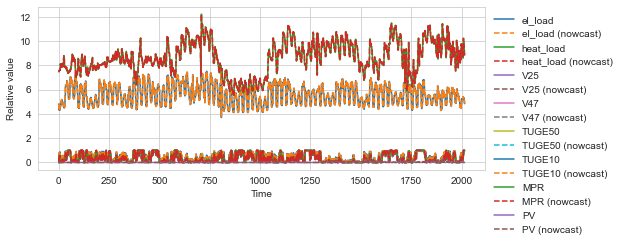

In [37]:
import matplotlib.dates as mdates
plt.figure(figsize=(8,3))
ax=plt.gca()
#day 6, hour 22: 6*24*12 + 22*12 = 
#tstart=7*24*12
#tlen=12*12
#xvalues = pd.date_range(start="00:00:00",freq="5min",periods=tlen)
#myFmt = mdates.DateFormatter('%H:%M')
#ax.xaxis.set_major_formatter(myFmt)
tstart=0
tlen=7*24*12
xvalues=range(tstart,tstart+tlen)
print(tstart,tlen)
for pr in profiles:
    if pr.id in ["curve_const","waterinj","h2target"]: continue
    color = next(ax._get_lines.prop_cycler)['color']
    plt.step(xvalues,pr.data[tstart:(tstart+tlen)],label=pr.id,color=color,where="post")
    if pr.data_nowcast is not None:
        color = next(ax._get_lines.prop_cycler)['color']
        plt.step(xvalues,pr.data_nowcast[tstart:(tstart+tlen)],"--",
                 label="{} (nowcast)".format(pr.id),color=color,where="post")        
plt.legend(loc="upper left",bbox_to_anchor=(1,1),frameon=False)
plt.xlabel("Time")
plt.ylabel("Relative value")
plt.savefig(outpath+"timerseries_ts{}_{}.pdf".format(tstart,case),dpi=300,bbox_inches="tight")

In [38]:
outpath

'result/'

In [39]:
# View profiles (entire available time windows)
scale=300/96 # ratio print vs screen dpi
fig=plots.plot_profiles(profiles,filename=None)
fig.update_layout(template="plotly_white",autosize=False,width=600,height=200,margin=dict(l=0,r=0,t=0,b=0))
fig.show()
#300 dpi and 4 inch: 1200 pixels
#fig.write_image(outpath+"profiles.pdf",width=600,height=200,scale=scale)

In [40]:
dev=simulator.optimiser.all_devices['wind'].dev_data
#fuelA = dev.fuel_A
#fuelB = dev.fuel_B
Pmax = dev.flow_max
#plots.plotGasTurbineEfficiency(filename='gasturbine_Gen1.png',fuelA=fuelA,fuelB=fuelB,Pmax=Pmax)

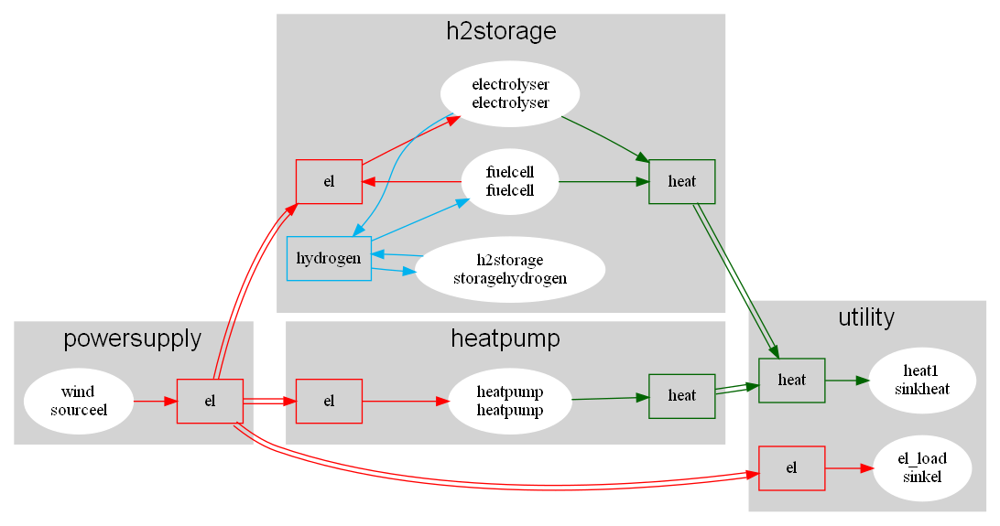

In [41]:
# View energy system
dotG=plots.plot_network(simulator,timestep=None,filename=None,rankdir="LR",hide_edgelabel=True,only_carrier=None,fontsize=20,fontname = "helvetica",)
IPython.display.Image(dotG.create_png(prog="dot")) #scales automatically to page width
#dotG.write_pdf(path=outpath+"diagram0_{}.pdf".format(case))

### Some checks on input data

In [42]:
25.12, 25.063, 25.081

(25.12, 25.063, 25.081)

In [43]:
print(simulator.optimiser.all_edges['h1'].edge_data)

EdgeHeatData(id='h1', node_from='h2storage', node_to='utility', length_km=0.01, flow_max=500.0, bidirectional=True, include=1, carrier='heat', power_loss_function=None)


## Solve

If the problem is infeasible, try 
* relaxing pressure deviation limits (generic value and per-node value)
* add a high cost emergency generator (that could represent load shedding) to ensure energy balance can be satisfied
* make sure excess heat/water/gas has a place to go


In [44]:
dev_d=simulator.optimiser.all_devices["wind"].dev_data
node_d=simulator.optimiser.all_nodes["powersupply"].node_data

In [45]:
#simulator.optimiser.write("testplatform.mps")
sim_result = simulator.run_simulation(solver="gurobi",time_range=timerange,write_yaml=False,time_limit=20)
print("Mean CO2 emission rate      = {:.1f} kgCO2/s".format(sim_result.co2_rate.mean()))
print("Mean CO2 emission intensity = {:.1f} kgCO2/Sm3oe".format(sim_result.co2_intensity.mean()))
#print("Mean export revenue         =",*["{}:{:.1f} ".format(x,v) for x,v in sim_result.export_revenue.mean().items() if v!=0],"$/s")

  0%|          | 0/24 [00:00<?, ?it/s]WARNING:pyomo.core:Loading a SolverResults object with a warning status into model.name="unknown";
  - termination condition: infeasibleOrUnbounded
  - message from solver: Problem proven to be infeasible or unbounded.
INFO:oogeso.core.optimiser:Solver Status:warning
  4%|▍         | 1/24 [00:00<00:19,  1.19it/s]WARNING:pyomo.core:Loading a SolverResults object with a warning status into model.name="unknown";
  - termination condition: infeasibleOrUnbounded
  - message from solver: Problem proven to be infeasible or unbounded.
INFO:oogeso.core.optimiser:Solver Status:warning
  8%|▊         | 2/24 [00:01<00:17,  1.24it/s]WARNING:pyomo.core:Loading a SolverResults object with a warning status into model.name="unknown";
  - termination condition: infeasibleOrUnbounded
  - message from solver: Problem proven to be infeasible or unbounded.
INFO:oogeso.core.optimiser:Solver Status:warning
 12%|█▎        | 3/24 [00:02<00:16,  1.28it/s]WARNING:pyomo.core:L

Mean CO2 emission rate      = 0.0 kgCO2/s
Mean CO2 emission intensity = nan kgCO2/Sm3oe


In [46]:
#simulator.optimiser.updateOptimisationModel(timestep=0,profiles=data.profiles,first=True)
simulator.optimiser.write("test.mps",io_options = {"symbolic_solver_labels":True})

('test.mps', 1408707953712)

In [47]:
#simulator.optimiser.constr_injectionwell_Pmax.pprint()
#simulator.optimiser.constrO_elReserveMargin[6].pprint()
pyo.value(simulator.optimiser.varEdgeFlow["e1",10])
#simulator.optimiser.constrE_w2_flow.pprint()

4.67

In [48]:
print(pyo.value(simulator.optimiser.paramProfiles["V47",1]),
    pyo.value(simulator.optimiser.varDeviceIsOn["wind",6]),
    pyo.value(simulator.optimiser.varDeviceIsOn["electrolyser",6]),
    pyo.value(simulator.optimiser.varDeviceIsOn["heatpump",6]),
)

0.3409200555493135 1 1 1


## Save/Load simulation results
By saving to pickle file, it easy to later open and analyse the results without having to re-run the simulation

In [49]:
pickle_save='{}case{}.pkl'.format(outpath,case)
# Save (pickle) - for later opening and analysis
dumpdata={"data":data,"result":sim_result}
with open(pickle_save, mode='wb') as file:
   cloudpickle.dump(dumpdata, file)
print("Results were saved to {}".format(pickle_save))

Results were saved to result/caseC.pkl


In [50]:
# Open previously saved object (including simulation results)
#with open("result/caseC.pkl", mode='rb') as file:
#   sim_data = cloudpickle.load(file)
#data=sim_data["data"]
#sim_result=sim_data["result"]

## Analyse results

In [51]:
import oogeso.result_analysis
#kpi = oogeso.result_analysis.compute_kpis(sim_result, sim_data=data, windturbines=['wind'])
#kpi = pd.DataFrame.from_dict(kpi,orient="index",columns=[case])
#kpi 

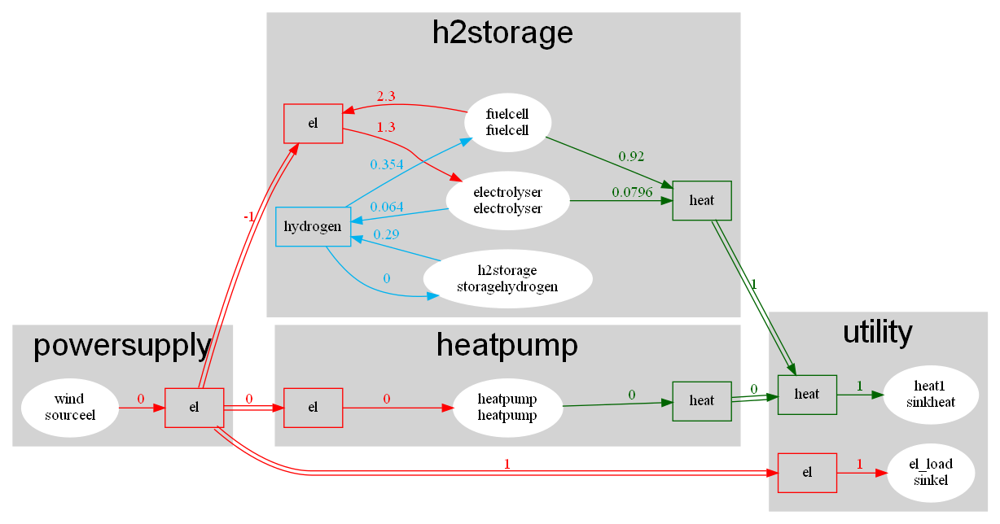

In [54]:
tstep=3
gCombined = plots.plot_network(simulator=simulator,timestep=tstep,numberformat="{:.3g}",
                              filename=None,only_carrier=None,fontsize=30,fontname = "helvetica",
                              hide_losses=True)
IPython.display.Image(gCombined.create_png())
#gCombined.write_png(path=outpath+"diagram_{}.pdf".format(case),f="pdf")
#gCombined.write_pdf(path=outpath+"diagram_{}.pdf".format(case))

In [ ]:
#simulator.optimiser.all_nodes['wells'].devices_serial
#sim_result.dfEdgeFlow.unstack("edge").loc[151]
simulator.optimiser.constrN_wells_energybalance["gas","out",0].pprint()
print(pyo.value(simulator.optimiser.varDeviceFlow["wellL1","gas","out",0]))
print(pyo.value(simulator.optimiser.varDeviceFlow["wellL2","gas","out",0]))
print(pyo.value(simulator.optimiser.varEdgeFlow["cL2g",0]))
print(pyo.value(simulator.optimiser.varEdgeLoss21["cL2g",0]))

AttributeError: 'OptimisationModel' object has no attribute 'constrN_wells_energybalance'

In [ ]:
print("CHECKING edge pressure drop on selected edges:")
optimiser = simulator.optimiser
print('w1: {:.5g} MPa'.format(optimiser.all_networks["water"].compute_edge_pressuredrop(optimiser.all_edges['w1'],Q=1.15,p1=0.7,linear=True)))
print('w3: {:.5g} MPa'.format(optimiser.all_networks["water"].compute_edge_pressuredrop(optimiser.all_edges['w3'],Q=1.3/15,p1=7,linear=False)))
print('o2: {:.5g} MPa'.format(optimiser.all_networks["oil"].compute_edge_pressuredrop(optimiser.all_edges['o2'],Q=0.1,p1=5,linear=True)))
print('g2: {:.5g} MPa'.format(optimiser.all_networks["gas"].compute_edge_pressuredrop(optimiser.all_edges['g2'],Q=48,p1=10,linear=True)))

CHECKING edge pressure drop on selected edges:


KeyError: 'water'

In [ ]:
#mc.checkEdgePressureDrop(timestep=1,var="outer")

In [279]:
plots.plotter='matplotlib'
fig2=plots.plot_sum_power_mix(sim_result,simulator.optimiser,carrier="el",filename=None,devs_shareload=[])#['Gen1','Gen2','Gen3'])
#fig2.update_layout(autosize=False,width=800,height=500,margin=dict(l=0,r=0,t=0,b=0))
#fig2.write_image("{}/elpowermix_{}.png".format(outpath,case))
#fig2.set_size_inches(6,4)
plt.suptitle("")
plt.show()
plt.savefig("result/poweroutput_{}x.pdf".format(case),dpi=300,bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

,el,heat
device,,
el_load,4.875761,0.000000
electrolyser,3.176071,0.000000
fuelcell,0.000000,0.000000
h2storage,0.000000,0.000000
heat1,0.000000,6.796856
heatpump,3.052670,0.000000
wind,0.000000,0.000000


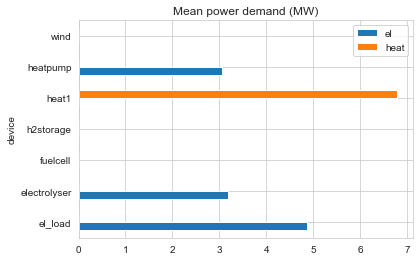

In [280]:
mean_el_demand = sim_result.device_flow.unstack('carrier')['el'].unstack('terminal')['in'].dropna().unstack().T.mean()
mean_heat_demand = sim_result.device_flow.unstack('carrier')['heat'].unstack('terminal')['in'].dropna().unstack().T.mean()
energydemand = pd.concat({'el':mean_el_demand,'heat':mean_heat_demand},axis=1)
#energydemand.drop('heatdump',inplace=True)
energydemand.plot.barh(title="Mean power demand (MW)")
energydemand

In [281]:
energydemand.sum()

el      11.104502
heat     6.796856
dtype: float64

In [282]:
mean_flows=sim_result.device_flow.unstack(["carrier","device","terminal"]).mean().unstack(["carrier","terminal"])
print("Mean flows:\n",mean_flows.sum())
print("Mean flow per device:")
mean_flows

Mean flows:
 carrier   terminal
el        in          11.104502
          out         11.104502
heat      in           6.796856
          out          6.796856
hydrogen  in           0.329771
          out          0.329771
dtype: float64
Mean flow per device:


carrier             el                heat            hydrogen         
terminal            in       out        in       out        in      out
device                                                                 
el_load       4.875761  0.000000  0.000000  0.000000  0.000000  0.00000
electrolyser  3.176071  0.000000  0.000000  0.194376  0.000000  0.15636
fuelcell      0.000000  1.242854  0.000000  0.497141  0.191208  0.00000
h2storage     0.000000  0.000000  0.000000  0.000000  0.138562  0.17341
heat1         0.000000  0.000000  6.796856  0.000000  0.000000  0.00000
heatpump      3.052670  0.000000  0.000000  6.105339  0.000000  0.00000
wind          0.000000  9.861649  0.000000  0.000000  0.000000  0.00000

In [285]:
plots.plotter="plotly"
gts = [d for d,d_obj in simulator.optimiser.all_devices.items() if d_obj.dev_data.model in ["wind","source_el"]]
fig=plots.plot_device_profile(sim_result,simulator.optimiser,devs=gts,filename=None,include_on_off=True,include_prep=False,devs_shareload=None)
fig.update_layout(autosize=False,width=700,height=300,margin=dict(l=0,r=0,t=30,b=0),template="plotly_white")
fig.show()
#300 dpi and 4 inch: 1200 pixels
scale=300/96 # ratio print vs screen dpi
#fig.write_image(outpath+"powersupply.pdf",width=700,height=300,scale=scale)

In [286]:
dfStartopt = pd.DataFrame()
inst=simulator.optimiser
for t in inst.setHorizon: 
    dfStartopt.loc[t,'start']=inst.varDeviceStarting['wind',t].value
    dfStartopt.loc[t,'prep']=inst.varDeviceIsPrep['heatpump',t].value
    dfStartopt.loc[t,'on']=inst.varDeviceIsOn['electrolyser',t].value
    dfStartopt.loc[t,'stop']=inst.varDeviceStopping['fuelcell',t].value
dfStartopt.head()

,start,prep,on,stop
0,NaN,0.0,1.0,NaN
1,NaN,0.0,1.0,NaN
2,NaN,0.0,1.0,NaN
3,NaN,0.0,1.0,NaN
4,NaN,0.0,1.0,NaN


In [287]:
fig=plots.plot_device_profile(sim_result,simulator.optimiser,devs=['wind'],filename=None,include_forecasts=True)
fig.update_layout(autosize=False,width=800,height=300,margin=dict(l=0,r=0,t=0,b=0))

In [ ]:
df=sim_result.device_flow.unstack([0,1,2])[[('ex_g','gas','in'),('ex_o','oil','in')]]
df.columns=['gas','oil']
df=df.reset_index()
df["gas"]=df["gas"]/1000 # convert to oil equivalents
df = df.melt(var_name="Product",value_name="Volume rate (Sm3oe/s)",id_vars=('time'))
px.line(df,x="time",y="Volume rate (Sm3oe/s)",color="Product",title="Oil/gas export volumes (Sm3oe/s)").show()

plots.plot_export_revenue(sim_result)

KeyError: "None of [MultiIndex([('ex_g', 'gas', 'in'),\n            ('ex_o', 'oil', 'in')],\n           names=['device', 'carrier', 'terminal'])] are in the [columns]"

In [288]:
simulator.optimiser.setDevice.pprint()

setDevice : device
    Size=1, Index=None, Ordered=Insertion
    Key  : Dimen : Domain : Size : Members
    None :     1 :    Any :    7 : {'wind', 'el_load', 'heat1', 'electrolyser', 'fuelcell', 'h2storage', 'heatpump'}


In [289]:
plots.plotter="plotly"
if 'battery' in simulator.optimiser.setDevice:
    fig=plots.plot_devicePowerEnergy(sim_result,'battery',
                                 filename=None)#outpath+"battery_opt.png")
    fig.update_layout(autosize=False,width=800,height=300,margin=dict(l=0,r=0,t=30,b=0)).show()
    oogeso.milp_plot.plotDevicePowerLastOptimisation1(mc,device='battery',
                filename=None)#outpath+"lastopt_battery.png")

In [290]:
plots.plotter="plotly"
fig=plots.plot_CO2_rate_per_dev(sim_result,simulator.optimiser,reverseLegend=True,filename=outpath+"co2rate_opt.png",devs_shareload=gts)
fig.update_layout(autosize=False,width=800,height=300,margin=dict(l=0,r=0,t=0,b=0))

In [ ]:
fig=plots.plot_CO2_intensity(sim_result,filename=outpath+"co2intensity_opt.png")
fig.update_layout(autosize=False,width=700,height=300,margin=dict(l=0,r=0,t=0,b=0))

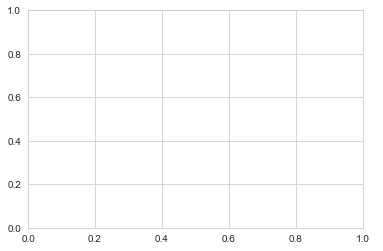

In [ ]:
plots.plotter="matplotlib"
fig=plots.plot_reserve(sim_result,simulator.optimiser,dynamicMargin=True,includeSum=False)
plt.legend(loc="upper left",bbox_to_anchor=(1,1),frameon=False)
#fig.set_size_inches(5.92,1.5)
plt.savefig("result/reserve_{}x.pdf".format(case),dpi=300,bbox_inches="tight")
#fig.update_layout(autosize=False,width=700,height=200,margin=dict(l=0,r=0,t=30,b=0),template="plotly_white")
#fig.update_layout(legend_traceorder="reversed")
#fig.show()
#300 dpi and 4 inch: 1200 pixels
#scale=300/96 # ratio print vs screen dpi
#fig.write_image(outpath+"reserve.pdf",width=700,height=200,scale=scale)

In [291]:
# This plot shows per device its output (dotted line) and the available online backup, iel reserve 
# by _other_ devices (solid line). MARGIN(t) = min_devices(backup(t) - output(t))
plots.plot_el_backup(sim_result,showMargin=True,returnMargin=False)

In [292]:
fig=plots.plot_device_power_energy(sim_result,simulator.optimiser,"h2storage")
fig.update_layout(autosize=False,width=800,height=250,margin=dict(l=0,r=0,t=30,b=0),template="plotly_white")
fig.update_yaxes(tick0=0, dtick=1,secondary_y=True,range=[0,5.5])
fig.update_yaxes(tick0=0, dtick=100e3,secondary_y=False,range=[0,550e3])
fig.show()
fig.write_image(outpath+"h2storage_{}.pdf".format(case))

In [293]:
simulator.optimiser.all_devices

{'wind': <oogeso.core.devices.source.SourceEl at 0x1eb4201b4f0>,
 'el_load': <oogeso.core.devices.sink.SinkEl at 0x1eb4201b730>,
 'heat1': <oogeso.core.devices.sink.SinkHeat at 0x1eb4201a8f0>,
 'electrolyser': <oogeso.core.devices.electrolyser.Electrolyser at 0x1eb4201b8e0>,
 'fuelcell': <oogeso.core.devices.fuelcell.FuelCell at 0x1eb4201b3d0>,
 'h2storage': <oogeso.core.devices.storage.StorageHydrogen at 0x1eb4201b550>,
 'heatpump': <oogeso.core.devices.heatpump.HeatPump at 0x1eb4201b9d0>}